In [ ]:
%load_ext tensorboard.notebook
%tensorboard --logdir logs

In [1]:
!pip install torchmetrics[image]

In [2]:
!pip install torchinfo

In [3]:
!pip install gdown

In [4]:
import gdown

# 2d_game_scenes.zip
# https://drive.google.com/file/d/17Z7_Fli_vgYuxO8JUoZICCiihG0sXYEY/view?usp=drive_link


url = "https://drive.google.com/us?id=17Z7_Fli_vgYuxO8JUoZICCiihG0sXYEY"

output = "game_scenes.zip"

gdown.download(url, output, quiet=False, fuzzy=True)

Downloading...
From (original): https://drive.google.com/uc?id=17Z7_Fli_vgYuxO8JUoZICCiihG0sXYEY
From (redirected): https://drive.google.com/uc?id=17Z7_Fli_vgYuxO8JUoZICCiihG0sXYEY&confirm=t&uuid=c1d88cd8-63be-4609-b5c9-ca7e6b52ccda
To: /kaggle/working/game_scenes.zip
100%|██████████| 108M/108M [00:05<00:00, 20.7MB/s] 


'game_scenes.zip'

In [5]:
import zipfile
zip_ref = zipfile.ZipFile("/kaggle/working/game_scenes.zip", 'r')
zip_ref.extractall("/kaggle/working/")
zip_ref.close()

In [20]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision.utils as vutils
import torchvision
import torchvision.datasets as datasets
from torchvision.transforms import v2
import torchvision.transforms.v2.functional as T
from torch.utils.data import DataLoader
from tqdm import tqdm
from torch.utils.tensorboard import SummaryWriter

torch.backends.cudnn.benchmarks = True

In [42]:
class Generator(nn.Module):
    
    def __init__(self, z_dim, img_size, img_channels=3):
        super().__init__()
        self.reg = 0
        self.img_size = img_size
        self.img_channels = img_channels

        feature = 64

        # 128 256
        # 256 512
        layers = []
        for i in range(3):
            layers.append(
                nn.Sequential(
                nn.Linear(feature, feature*2, bias=False),
                nn.Dropout(0.3, True),
                nn.BatchNorm1d(feature*2),
                nn.LeakyReLU(0.1, True)
                )
            )
            feature *= 2

        self.layers = nn.Sequential(*layers)

        self.init = nn.Sequential(
            nn.Linear(z_dim, 64, bias=False),
        )

        self.last = nn.Sequential(
                nn.Linear(512, self.img_size * self.img_size * self.img_channels),
                nn.Tanh()
                )

    def forward(self, x):
        batch_size, *_ = x.shape
        # ortho_loss = orthogonal_reg(self.fc1.weight) + \
        #                 orthogonal_reg(self.fc2.weight) + \
        #                 orthogonal_reg(self.fc3.weight) + \
        #                 orthogonal_reg(self.fc4.weight)
        # self.reg = ortho_loss
        
        # b x z_dim x 1 x 1
        x = self.init(x)
        
        # b x 128 x 1 x 1
        x = self.layers(x)
        x = self.last(x)

        # b x img_size * img_size * 3 x 1 x 1
        x = x.unsqueeze(-1).unsqueeze(-1)
#         return F.pixel_shuffle(x, self.img_size)
        return x.reshape(batch_size, self.img_channels, self.img_size, self.img_size)


class Discriminator(nn.Module):
    
    def __init__(self, img_size, img_channels = 3):
        super().__init__()
        init = [
            nn.Linear(img_size * img_size * img_channels, 512),
            nn.LeakyReLU(0.2, True)
        ]
        layers = []
        in_ch = 512
        out_ch = in_ch // 2
        for i in range(3):
            layers += [
                nn.Linear(in_ch, out_ch,bias=False),
                nn.Dropout(0.3, True),
                nn.BatchNorm1d(out_ch),
                nn.LeakyReLU(0.2, True)
            ]
            in_ch //= 2
            out_ch //= 2
        
        self.model = nn.Sequential(
            *init,
            *layers,
            nn.Linear(in_ch, 1)
        )

    def forward(self, x):
        # x - [b X 3 X img_size X img_size]
        batch_size, *_ = x.shape
        # ortho_loss = orthogonal_reg(self.fc1.weight) + \
        #                 orthogonal_reg(self.fc2.weight) + \
        #                 orthogonal_reg(self.fc3.weight)
        # self.reg = ortho_loss
        x = x.view(batch_size, -1)
#         print(x.shape)
        return self.model(x)

In [4]:
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
DATASET_NAME = "sentinel-2"
DATASET_PATH = "/kaggle/output/"
CHANNELS_IMG = 3
IMAGE_SIZE = 64
BATCH_SIZE = 32
NUM_EPOCHS = 20
Z_DIM = 64
LEAKY_SLOPE = 0.2
LEARNING_RATE = 3e-4
LEARNING_RATE_G = 3e-4
gradient_penalty_coefficient = 10


In [81]:
z = torch.randn(BATCH_SIZE, Z_DIM).to(DEVICE)
print(z.shape)
gen = Generator(Z_DIM, 28, 1).to(DEVICE)

fake  = gen(z)
print(fake.shape)

disc = Discriminator(28, 1).to(DEVICE)

fake_pred = disc(fake)
print(fake_pred.shape)

import torchinfo

torchinfo.summary(gen, input_size=z.shape, col_names = ("input_size", "output_size", "num_params"))

torch.Size([32, 256])
torch.Size([32, 1, 28, 28])
torch.Size([32, 1])


Layer (type:depth-idx)                   Input Shape               Output Shape              Param #
Generator                                [32, 256]                 [32, 1, 28, 28]           --
├─Sequential: 1-1                        [32, 256]                 [32, 64]                  --
│    └─Linear: 2-1                       [32, 256]                 [32, 64]                  16,384
├─Sequential: 1-2                        [32, 64]                  [32, 512]                 --
│    └─Sequential: 2-2                   [32, 64]                  [32, 128]                 --
│    │    └─Linear: 3-1                  [32, 64]                  [32, 128]                 8,192
│    │    └─Dropout: 3-2                 [32, 128]                 [32, 128]                 --
│    │    └─BatchNorm1d: 3-3             [32, 128]                 [32, 128]                 256
│    │    └─LeakyReLU: 3-4               [32, 128]                 [32, 128]                 --
│    └─Sequential: 2-3     

In [82]:
torchinfo.summary(disc, input_size=fake.shape, col_names = ("input_size", "output_size", "num_params"))

Layer (type:depth-idx)                   Input Shape               Output Shape              Param #
Discriminator                            [32, 1, 28, 28]           [32, 1]                   --
├─Sequential: 1-1                        [32, 784]                 [32, 1]                   --
│    └─Linear: 2-1                       [32, 784]                 [32, 512]                 401,920
│    └─LeakyReLU: 2-2                    [32, 512]                 [32, 512]                 --
│    └─Linear: 2-3                       [32, 512]                 [32, 256]                 131,072
│    └─Dropout: 2-4                      [32, 256]                 [32, 256]                 --
│    └─BatchNorm1d: 2-5                  [32, 256]                 [32, 256]                 512
│    └─LeakyReLU: 2-6                    [32, 256]                 [32, 256]                 --
│    └─Linear: 2-7                       [32, 256]                 [32, 128]                 32,768
│    └─Dropout: 2-8 

In [5]:
def d_logistic_loss(real_pred, fake_pred):
    real_loss = F.softplus(-real_pred).mean()
    fake_loss = F.softplus(fake_pred).mean()
    return real_loss + fake_loss

def g_nonsaturation_loss(fake_pred):
    loss = F.softplus(-fake_pred).mean()
    return loss

def cycle(iterable):
    while True:
        for x in iterable:
            yield x

class GradientPenalty(nn.Module):
    # x ~ D
    # d id D(x)
    def forward(self, x: torch.Tensor, d: torch.Tensor):
        batch_size = x.shape[0]
        gradients, *_ = torch.autograd.grad(outputs=d,
                                            inputs=x,
                                            grad_outputs=d.new_ones(d.shape),
                                            create_graph=True)
        gradients = gradients.reshape(batch_size, -1)

        norm = gradients.norm(2, dim=1)

        return torch.mean(norm ** 2)

In [6]:
def set_requires_grad(model, bool):
    for p in model.parameters():
        p.requires_grad = bool

def initialize_weights(model):
    # Initializes weights according to the DCGAN paper
    for m in model.modules():
        if isinstance(m, (nn.Linear, nn.BatchNorm2d)):
            nn.init.normal_(m.weight.data, 0.0, 0.02)


def interpolate(batch):
    return F.interpolate(batch, (299, 299), mode="bilinear")


def instance_noise(x: torch.Tensor, stddev=0.1):
    noise = torch.empty_like(x).normal_(0.0, stddev).to(DEVICE)
    return x + noise

In [7]:
def save_checkpoint(state, filename="dataset_gan_.pth"):
    print("=> Saving checkpoint")
    torch.save(state, filename)


def load_checkpoint(checkpoint, gen, disc):
    print("=> Loading checkpoint")
    gen.load_state_dict(checkpoint['gen'])
    disc.load_state_dict(checkpoint['disc'])

In [8]:
IMAGE_SIZE=64
transforms = v2.Compose(
    [
        v2.Resize((IMAGE_SIZE, IMAGE_SIZE)),
        v2.ToTensor(),
        v2.RandomAutocontrast(1.0),
#         v2.Grayscale(1),
#         v2.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        v2.Normalize(mean=(0.5,0.5,0.5), std=(0.5,0.5,0.5))
    ]
)

/opt/conda/lib/python3.10/site-packages/torchvision/transforms/v2/_deprecated.py:43: UserWarning: The transform `ToTensor()` is deprecated and will be removed in a future release. Instead, please use `v2.Compose([v2.ToImage(), v2.ToDtype(torch.float32, scale=True)])`.
  warnings.warn(


In [9]:
DATASET_PATH = "/kaggle/working/2d_game_scenes"
dataset = datasets.ImageFolder(root=DATASET_PATH, transform=transforms)
loader = DataLoader(
    dataset,
    batch_size=BATCH_SIZE,
    shuffle=True
)
test_dataset = torch.utils.data.Subset(dataset, torch.arange(3000))

test_dataloader = torch.utils.data.DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    drop_last=True
)

In [10]:
# for tensorboard plotting
fixed_noise = torch.randn(BATCH_SIZE, Z_DIM).to(DEVICE)
writer_real = SummaryWriter(f"logs/{DATASET_NAME}/real")
writer_fake = SummaryWriter(f"logs/{DATASET_NAME}/fake")
step = 0

In [11]:
g_loss = g_nonsaturation_loss
d_loss = d_logistic_loss

gradient_penalty = GradientPenalty().to(DEVICE)

In [12]:
def L2_reg(model):
    l1_crit = nn.L1Loss(size_average=False)
    reg_loss = 0
    for param in model.parameters():
        reg_loss += l1_crit(param, torch.zeros_like(param))

    factor = 0.00005
    return factor * reg_loss

In [43]:
Z_DIM = 100

from torchmetrics.image.fid import FrechetInceptionDistance
from tqdm import tqdm
import matplotlib.pyplot as plt

gen = Generator(Z_DIM, IMAGE_SIZE).to(DEVICE)
disc = Discriminator(IMAGE_SIZE).to(DEVICE)

# initializate optimizer
opt_gen = optim.Adam(gen.parameters(), lr=3e-4, weight_decay=2.5e-5)
opt_disc = optim.Adam(disc.parameters(), lr=3e-4, weight_decay=2.5e-5)

initialize_weights(gen)
initialize_weights(disc)

gen.train()
disc.train()

criterion = nn.BCEWithLogitsLoss()

save_model = True
done = False

dataiter = iter(cycle(test_dataloader))
fid = FrechetInceptionDistance(feature=192, normalize=True).to(DEVICE)

scaler = torch.cuda.amp.GradScaler()
# disc_scaler = torch.cuda.amp.GradScaler()

fid_value = torch.zeros(1).to(DEVICE)

step = 0

LOG_FID_INTERVAL = len(loader) // 20
FIG_INTERVAL = len(loader) // 2

In [18]:
gen = torch.load("/kaggle/working/gen.pth")
# disc.load_state_dict(torch.load("/kaggle/working/desc.pth"))

In [44]:
folder = "/kaggle/working/images"
import os, shutil
for filename in os.listdir(folder):
    file_path = os.path.join(folder, filename)
    try:
        if os.path.isfile(file_path) or os.path.islink(file_path):
            os.unlink(file_path)
        elif os.path.isdir(file_path):
            shutil.rmtree(file_path)
    except Exception as e:
        print('Failed to delete %s. Reason: %s' % (file_path, e))

In [40]:
import random
def rand_blur(x):
    return T.gaussian_blur(x, random.choice([3,5,7]))

# def rand_gamma(x):
#     return x ** (random.random() + 1.0)

def rand_sharpness(x):
    return T.adjust_brightness(x, random.randint(1, 5))

def rand_hue(x):
    return T.adjust_hue(x, random.random() / 2)

aug_fns = [
    rand_blur,
#     rand_gamma,
    rand_sharpness,
    rand_hue
]

def augmentation(x: torch.Tensor):
    for aug_fn in aug_fns:
        x = aug_fn(x)
    return x.contiguous()

In [61]:
update_progress_bar = 20
NUM_EPOCHS = 100
label_softness = 0.2

step = 0
steps = []
d_real_losses = []
d_fake_losses = []
g_losses = []
fids = []

try:
    for epoch in range(NUM_EPOCHS):
        loop = tqdm(enumerate(loader), total=len(loader), leave=False)
        real: torch.Tensor
        for batch_idx, (real, _) in loop:
            
            with torch.cuda.amp.autocast():

#                 scaler.scale(real_loss).backward()

                
                noise = torch.randn(BATCH_SIZE, Z_DIM).to(DEVICE)
                fake = gen(noise)

                fake_pred = disc(fake)

                fake_labels = torch.empty_like(fake_pred).uniform_(0.0, label_softness)

                fake_loss = criterion(fake_pred, fake_labels)
                
                d_fake_losses.append(fake_loss.item())
                
                real = real.to(DEVICE)
#                 _fake = fake.clone().detach()
#                 if random.random() < 0.5:
#                     _fake = augmentation(fake.clone().detach())
                    
#                 real = torch.cat([real, _fake], dim=0)
#                 print(real.shape)

                if random.random() < 0.5:
                    real = augmentation(real)

                real_output = disc(real)

                real_labels = torch.empty_like(real_output).uniform_(1-label_softness, 1)

                real_loss = criterion(real_output, real_labels)
                
                d_real_losses.append(real_loss.item())

#                 scaler.scale(fake_loss).backward()

            lossD = (real_loss+fake_loss) / 2
            opt_disc.zero_grad()
            scaler.scale(lossD).backward()
            scaler.step(opt_disc)
            scaler.update()

            
            with torch.cuda.amp.autocast():
                noise = torch.randn(BATCH_SIZE, Z_DIM).to(DEVICE)
                fake = gen(noise)
                #             fake = instance_noise(fake)

                output = disc(fake)
                
                real_labels = torch.empty_like(output).uniform_(1-label_softness, 1)

                gen_loss = criterion(output, real_labels)
                
#                 reg_loss = L2_reg(gen)
                    
#                 gen_loss = gen_loss + reg_loss
                
                g_losses.append(gen_loss.item())
                
            opt_gen.zero_grad()
            scaler.scale(gen_loss).backward()
            scaler.step(opt_gen)
            scaler.update()

            step += 1

            if (batch_idx+1) % LOG_FID_INTERVAL == 0:
                real, _ = next(dataiter)

                with torch.cuda.amp.autocast():
                    real = real.to(DEVICE)
                    
                    noise = torch.randn(BATCH_SIZE, Z_DIM).to(DEVICE)
                    fake = gen(noise)
                    
                    both = torch.cat([fake.detach(), real], dim=0)
                    grid = vutils.make_grid(both, nrow=BATCH_SIZE//2, normalize=True)
                    vutils.save_image(grid, f"/kaggle/working/images/{epoch}-{batch_idx}.jpg")

                    real = interpolate(real)
                    fake = interpolate(fake)

                    fid.update(real, real=True)
                    fid.update(fake, real=False)
                    fid_value = fid.compute()
                    fids.append(fid_value.item())
                    fid.reset()
                    
            step+= 1
            steps.append(step)
            # update progress bar
            if batch_idx % update_progress_bar == 0:
                loop.set_description(f"Epoch [{epoch}/{NUM_EPOCHS}]")
                loop.set_postfix(loss_g = gen_loss.item(), loss_d = lossD.item(), fid = fid_value.item() )

except KeyboardInterrupt:
    done = True

if done or save_model:
    save_checkpoint(gen, "/kaggle/working/gen.pth")
    save_checkpoint(disc, "/kaggle/working/desc.pth")



=> Saving checkpoint
=> Saving checkpoint


In [96]:
import shutil

output_filename = "/kaggle/working/images28"
dir_name = "/kaggle/working/images"
shutil.make_archive(output_filename, 'zip', dir_name)

'/kaggle/working/images28.zip'

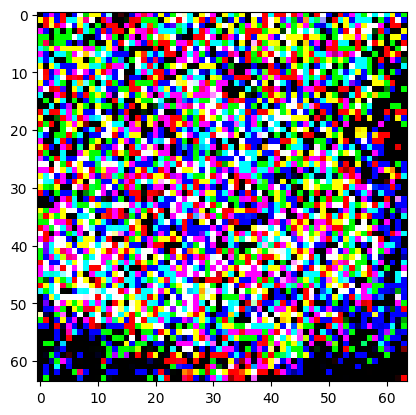

In [70]:
with torch.no_grad():
    gen.eval()
    fake = gen(torch.randn(1, Z_DIM).to(DEVICE))

#     img_grid_fake = torchvision.utils.make_grid(fake, normalize=True).permute((1, 2, 0)).cpu().detach().numpy()
#     img_grid_fake = img_grid_fake / 2 + 0.5
    img = fake.squeeze(0).permute((1, 2, 0)).cpu().detach().numpy()
    img = img / 2 + 0.5
    plt.imshow(img)
    plt.savefig("res.jpg")

In [60]:
real, _ = next(dataiter)

fid_values = []

for i in range(10):

    with torch.cuda.amp.autocast():
        real = real.to(DEVICE)
        noise = torch.randn(BATCH_SIZE, Z_DIM).to(DEVICE)
        fake = gen(noise)

        real = interpolate(real)
        fake = interpolate(fake)

        fid.update(real, real=True)
        fid.update(fake, real=False)
        fid_value = fid.compute()
        fid_values.append(fid_value.item())
        fid.reset()
        
import numpy as np

fid_values = np.array(fid_values)

print(np.mean(fid_values))

167.3


In [22]:
import matplotlib.pyplot as plt
import numpy as np

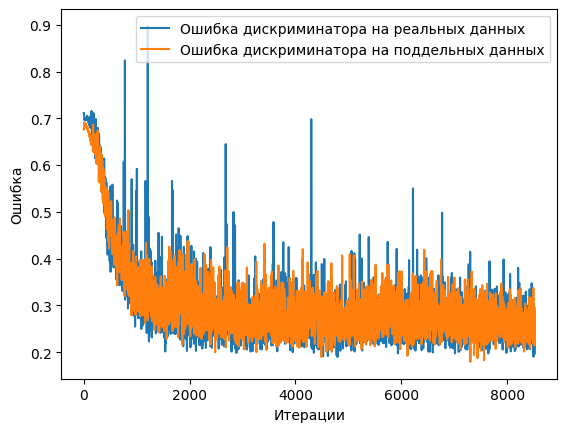

In [30]:
plt.xlabel("Итерации")
plt.ylabel("Ошибка")
plt.plot(steps, d_real_losses, label="Ошибка дискриминатора на реальных данных")
plt.plot(steps, d_fake_losses, label="Ошибка дискриминатора на поддельных данных")
plt.legend()
plt.savefig("/kaggle/working/d_r_f__losses.png")
plt.show()

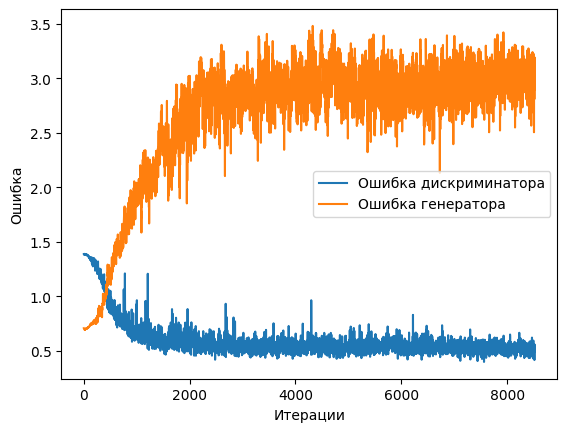

In [31]:
d_real_losses = np.array(d_real_losses)
d_fake_losses = np.array(d_fake_losses)
g_losses = np.array(g_losses)

d_losses = d_real_losses + d_fake_losses

plt.xlabel("Итерации")
plt.ylabel("Ошибка")
plt.plot(steps, d_losses, label="Ошибка дискриминатора")
plt.plot(steps, g_losses, label="Ошибка генератора")
plt.legend()
plt.savefig("/kaggle/working/d_g__losses.png")
plt.show()

In [21]:
print(np.mean(d_losses))
print(np.mean(g_losses))

NameError: name 'd_losses' is not defined

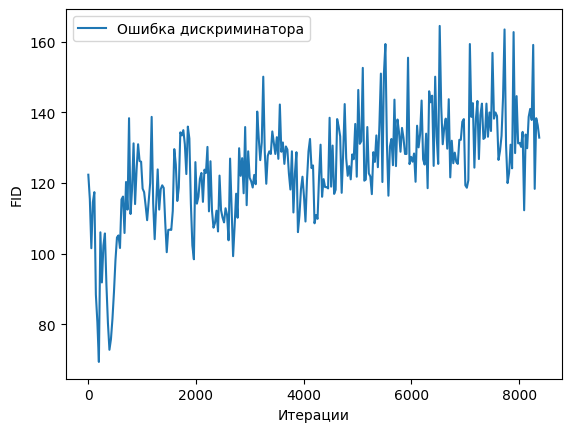

In [41]:
# LOG_FID_INTERVAL+1
steps_fids = steps[::LOG_FID_INTERVAL]

plt.xlabel("Итерации")
plt.ylabel("FID")
plt.plot(steps_fids[:-5], fids, label="Ошибка дискриминатора")
plt.legend()
plt.savefig("/kaggle/working/fid.png")
plt.show()

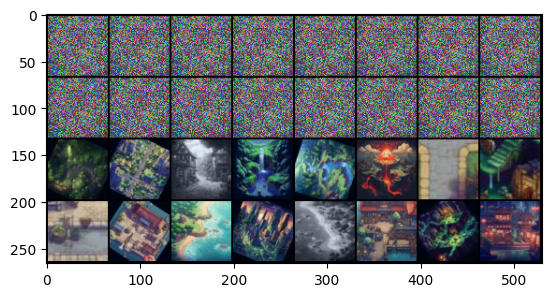

In [ ]:
fixed_noise = torch.randn((16, Z_DIM)).to(DEVICE)
real, _ = next(dataiter)
real = real.to(DEVICE)
real_images = real.unbind(0)

with torch.no_grad():
    real_images = real_images[:16]
    
    real_images = [x[None, :, :, :] for x in real_images]
    
    real_images = torch.cat(real_images, dim=0)
    
    fake = gen(fixed_noise)
    
#     fake = fake / 2 + 0.5
    
    images = torch.cat([fake, real_images], dim=0)
    
    grid = torchvision.utils.make_grid(images, nrow=8, normalize=True)
    
    torchvision.utils.save_image(grid, "/kaggle/working/grid.png")
    
    data = grid.cpu().detach().numpy()
    img1 = np.transpose(data, (1, 2, 0))
    
    plt.imshow(img1)
    plt.show()
    

In [29]:
loss1 = []
loss2 = []
for metric in metrics:
    loss1.append(metric[0].cpu().detach().numpy())
    loss2.append(metric[1].cpu().detach().numpy())

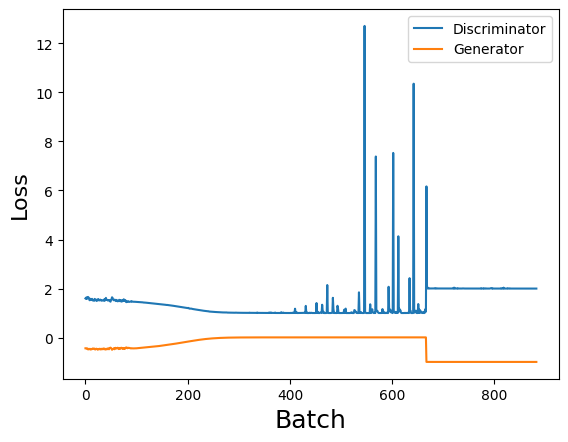

In [30]:
plt.plot(loss1, label="Discriminator")
plt.plot(loss2, label="Generator")
plt.legend()
plt.xlabel('Batch', fontsize=18)
plt.ylabel('Loss', fontsize=16)
plt.show()